# Sentinel L1-GIF-Template

## Setup python environment

If you don't have Anaconda or python installed, download and install the respective compatable versions from the following links:
https://anaconda.org/https://www.anaconda.com/products/individual
https://www.python.org/downloads/

For windows you should first launch your conda prompt. If you don't know how to launch the conda prompt in Windows check here. Once the conda prompt is launched, you should run the following four commands in this prompt:

For Mac you should open your terminal (Spotlight Search -> Terminal) and the you can directly run the following four commands in the terminal:

    conda create -n ox -c conda-forge python=3 osmnx

    conda activate ox

    conda install -c conda-forge cartopy

    conda install -c conda-forge matplotlib-scalebar

    pip install sentinelhub



[Developed by Stef Lhermitte]
https://github.com/steflhermitte/EO-Notebooks

Make sure ox is activated before you install the following packages.

To install iceutils to normalize images, follow installation instructions:
https://github.com/bryanvriel/iceutils

conda list # to see installed packages

matplotlib (matplotlib-base) should already be installed

check what packages are already installed and skip installation of those packages

Or download github file as zip file and unzip. and run the following to install on Anaconda prompt to install dependancies:
    
    conda install -c anaconda astropy

    pip install h5py

    conda install -c conda-forge scikit-image

    conda install -c conda-forge scikit-learn

    conda install -c conda-forge tqdm

    pip install pint

    pip install pymp

    conda install -c conda-forge s2cloudless

    pip install opencv-python

    cd C:\Users\user\Downloads\iceutils-master\iceutils-master #or where the setup.py file is located
    python setup.py install


conda list to see installed packages

if scipy, gdal, imageio, PIL, pyproj are not installed from installations above (because they are dependancies), install

Once you succeeded in installing these packages,open anaconda navigator HOME and click "Applications on ox" and install jupyter notebooks.

Open anaconda navigator ENVIRONMENTS, click ox and the play button to open jupyter notebooks. 

In [4]:
import scipy.ndimage as ndimage
import cv2 as cv
import iceutils as ice
import matplotlib.image as mpimg
import gdal
import imageio

from astropy.visualization import (MinMaxInterval, SqrtStretch, ImageNormalize, ManualInterval, PercentileInterval, AsymmetricPercentileInterval, ZScaleInterval)

In [5]:
import sys
import os
import datetime
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from sentinelhub import WmsRequest, WcsRequest, MimeType, CRS, BBox
from sentinelhub import CustomUrlParam, geo_utils
import sentinelhub

%matplotlib inline

from PIL import Image #as im

Using [Sentinel Hub Configurator](https://apps.sentinel-hub.com/configurator/). Create a new configuration (`"Add new configuration"`) and set the configuration to be based on **Python scripts template**.

If you do not have an account, you can make a free trial account.

Put configuration's **instance ID** in the following cell:

In [6]:
#INSTANCE_ID = '620d8d32-b0be-45e0-9347-cfc758b8f465'
INSTANCE_ID = ''

## Example: Roosevelt Island-Sentinel L1

Choose boundary box coordinates (w, n, e, s) and image extend coordinates (w, e, n, s). 

In [7]:
bbox_epsg4326 = [-164.78822, -78.87140, -165.41182, -78.79268]
img_extent = ([bbox_epsg4326[0], bbox_epsg4326[2], bbox_epsg4326[1],bbox_epsg4326[3]])

All requests require bounding box to be given as an instance of sentinelhub.common.BBox with corresponding Coordinate Reference System (sentinelhub.common.CRS).

In our case it is in WGS84 and we can use the predefined WGS84 coordinate reference system from sentinelhub.common.CRS, but it could also be coordinates in WebMercator (i.e., POP_WEB ) and constants in form UTM_(zone)(direction).
    
Choose range of dates to retrieve data from
    
Name directory for files to be saved to

In [8]:
delft_bbox = BBox(bbox=bbox_epsg4326,crs=CRS.WGS84)
date_='2012-02-09', '2020-06-07'
folderpng = 'RIpng'
folderl1 = 'RItifl1'
folders1 = 'RItifs1'
folderm =  'RItifm'
cwd = os.getcwd()

# Save Sentinel2 L1C Bands

We will call for sentinel2 l1c bands.

Each band's wavelength can be found here: https://gisgeography.com/sentinel-2-bands-combinations/

In [9]:
my_evalscript = '''return [B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B10,B11,B12]'''

details on WcsRequest can be found by running ?WcsRequest

    Set layer to which satellite you want (we are using Sentinel-2 L1C data (Top-Of-Atmosphere reflectance)

    boundary box- area of images

    time- range of dates

    resx, resy, - resolution

    image format- can be png, tif, etc.

    maxcc- max amount of cloud coverage allowed (value between .00 to 1.00)

    Attribute {CustomUrlParam.TRANSPARENT: True, adds new "band" that tells if part of file has no data. Use this to filter out bands for no data

In [10]:
wms_bands_request = WcsRequest(layer='TRUE-COLOR-S2-L1C',
                                bbox=delft_bbox,
                                time=(date_),
                                resx='10m',
                                resy='10m',
                                data_folder= folderl1,
                                image_format=MimeType.TIFF_d32f,
                                instance_id=INSTANCE_ID,
                                maxcc = 0.05,
                                custom_url_params=
                                                   {CustomUrlParam.TRANSPARENT: True,
                                                   CustomUrlParam.EVALSCRIPT: my_evalscript})

C:\Users\UROP\anaconda3\envs\ox\lib\site-packages\sentinelhub\data_request.py:46: SHDeprecationWarning: Parameter 'instance_id' is deprecated and will soon removed. Use parameter 'config' instead
  warnings.warn("Parameter 'instance_id' is deprecated and will soon removed. Use parameter 'config' instead",


In [11]:
wms_bands_img = wms_bands_request.get_data(save_data=True, redownload=False)

In [12]:
wms_bands_dates = wms_bands_request.get_dates()
wms_bands_dates

[datetime.datetime(2016, 12, 3, 18, 34, 59),
 datetime.datetime(2016, 12, 8, 17, 45, 52),
 datetime.datetime(2016, 12, 13, 18, 34, 57),
 datetime.datetime(2017, 1, 5, 18, 46, 25),
 datetime.datetime(2017, 1, 15, 18, 44, 51),
 datetime.datetime(2017, 1, 19, 18, 24, 53),
 datetime.datetime(2017, 1, 25, 18, 45),
 datetime.datetime(2017, 2, 1, 18, 34, 55),
 datetime.datetime(2017, 2, 2, 18, 5, 23),
 datetime.datetime(2017, 2, 15, 18, 15, 8),
 datetime.datetime(2018, 1, 20, 18, 44, 54),
 datetime.datetime(2018, 10, 29, 18, 37, 2),
 datetime.datetime(2018, 12, 3, 17, 47, 10),
 datetime.datetime(2018, 12, 18, 18, 37),
 datetime.datetime(2019, 1, 17, 18, 37, 4),
 datetime.datetime(2019, 2, 16, 18, 37, 4),
 datetime.datetime(2019, 2, 20, 18, 17, 8),
 datetime.datetime(2019, 2, 20, 18, 17, 19),
 datetime.datetime(2019, 11, 6, 18, 47, 3),
 datetime.datetime(2019, 11, 26, 18, 46, 59),
 datetime.datetime(2019, 12, 16, 18, 46, 58),
 datetime.datetime(2020, 2, 14, 18, 46, 59),
 datetime.datetime(2020

In [15]:
path = cwd + "\\" + folderl1
filesl1 = os.listdir(path)

Display images
Put in loop to easily display all of the images, but may display and normalize them individually
wms_bands_img[i][:,:,(choose band to display)] 

Normalize
    can use astropy ImageNormalize (documentaiton on different Intervals found here: https://docs.astropy.org/en/stable/visualization/)
    can use vmin vmax provide the range for color scaling

cmap choose color

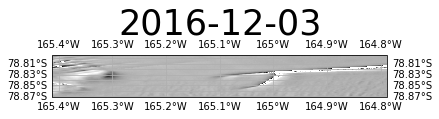

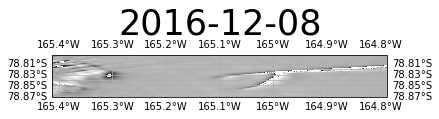

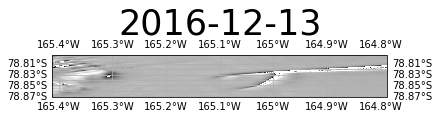

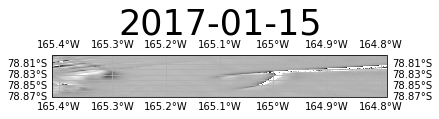

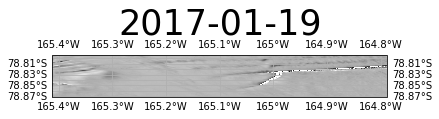

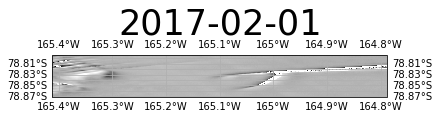

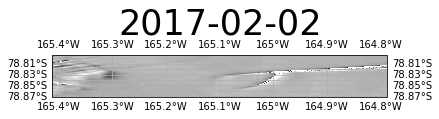

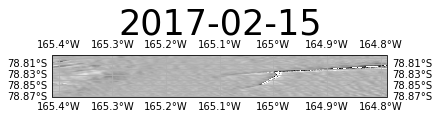

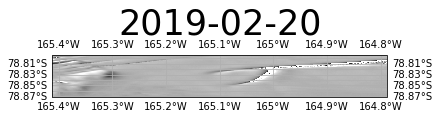

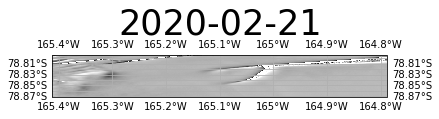

In [18]:
frames1 = []
folder = os.getcwd() + "\\" + folderpng + '\\frames1'
if not os.path.exists(folder):
    os.makedirs(folder)
os.chdir(folder)
for i in range (0, len(wms_bands_img)):
    if 0 not in np.array(wms_bands_img[i][:,:,12]):
        norm = ImageNormalize(wms_bands_img[i][:,:,4], interval= ZScaleInterval(nsamples=50000, contrast=0.15), stretch=SqrtStretch())
        #norm1 = ImageNormalize(wms_bands_img[i][:,:,4], interval = MinMaxInterval(), stretch=SqrtStretch())
        #third method to normalize does not use astropy's Image Normalization, but will require more individual adjustments to vmin and max for each image
        plt.figure()
        ax = plt.axes(projection=ccrs.PlateCarree())
        img_extent = img_extent
        ax.set_extent(img_extent, crs = ccrs.PlateCarree())
        ax.imshow(wms_bands_img[i][:,:,4],norm = norm, extent=img_extent, origin='upper',cmap='gray')
        #ax.imshow(wms_bands_img[i][:,:,4],norm = norm1, vmin = .5, vmax = .9, extent=img_extent, origin='upper',cmap='magma')
        #ax.imshow(wms_bands_img[i][:,:,4], vmin = .5, vmax = .9, extent=img_extent, origin='upper',cmap='magma')
        ax.gridlines(draw_labels=True)
        ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 15)
        name = 'foo1' + str(i) + '.png'
        plt.savefig(name)
        new_frame = Image.open(name)
        frames1.append(new_frame)

        
frames1[0].save('png_to_gif1.gif', format='GIF',
               append_images=frames1[1:],
               save_all=True,
               duration=300, loop=0)


os.chdir(cwd)

# Access multiple bands and normalize

Saving each individual band a tif file.

If bands were already saved in folder from previous run, the loop may throw and error. 
Then use ''' ''' marks to comment out the loop 

In [17]:
for i in range(0, len(wms_bands_dates)): 
    os.chdir(directory1)
    filename = filesl1[i] 
    date = (str(wms_bands_dates[i])[:10])
    folder = directory1 +'\\'+ folderl1 + '\\Bands\\' + date+'_'+'bands'
    if not os.path.exists(folder):
        os.makedirs(folder)
        os.chdir(folder)
        for z in range (0, 13):
            new_filename = 'B'+str(z)+'.tif'
            band = wms_bands_img[i][:,:,z]
            imageio.imwrite(new_filename, band)

os.chdir(cwd)

In [18]:
#The filenames for the different bands
directory = directory1 +'\\'+ folderl1 + '\\Bands\\' + (str(wms_bands_dates[0])[:10])+'_'+'bands\\' +'B'
blue_file = directory + str(1) +'.tif'
green_file = directory + str(2) +'.tif'
red_file = directory + str(3) +'.tif'


In [19]:
#Load bands 4, 5, and 6 with the same projWin as before
b4 = ice.Raster(directory + str(4) +'.tif')
b5 = ice.Raster(directory + str(5) +'.tif')
b6 = ice.Raster(directory + str(6) +'.tif')

In [20]:
#Load only RasterInfo (metadata) for one of the bands
hdr = ice.RasterInfo(blue_file)

In [21]:
#Print out the geographic bounds for this band
#Since the projection system of these rasters is UTM 6N, the coordinates printed to the screen will be in meters
print('Geographic extent [X_min, X_max, Y_min, Y_max]:', hdr.extent)



Geographic extent [X_min, X_max, Y_min, Y_max]: [   0. 1342.  875.    0.]


In [22]:
#The latitude-longitude coordinates of area of interest
lat_min = bbox_epsg4326[3]
lat_max = bbox_epsg4326[1]
lon_min = bbox_epsg4326[2]
lon_max = bbox_epsg4326[0]
bbox = [lat_min, lon_min, lat_max, lon_max]


lng = [lon_min, lon_max]
lat = [lat_min, lat_max]

In [23]:
#Create a UTM bounding box ("projection window" in GDAL terminology)
projWin = [sentinelhub.geo_utils.wgs84_to_utm(lon_min, lat_min, utm_crs=None)[0], sentinelhub.geo_utils.wgs84_to_utm(lon_min, lat_min, utm_crs=None)[1], 
sentinelhub.geo_utils.wgs84_to_utm(lon_max, lat_max, utm_crs=None)[0], sentinelhub.geo_utils.wgs84_to_utm(lon_max, lat_max, utm_crs=None)[1]]

In [24]:
#Read raster data for area of interest for blue band
blue_raster = ice.Raster(blue_file)#, projWin=projWin)


In [25]:
#Get the coordinates for our area (convert to km)
extent = 1.0e-3 * blue_raster.hdr.extent


Text(0.5, 1.0, '2020-03-02')

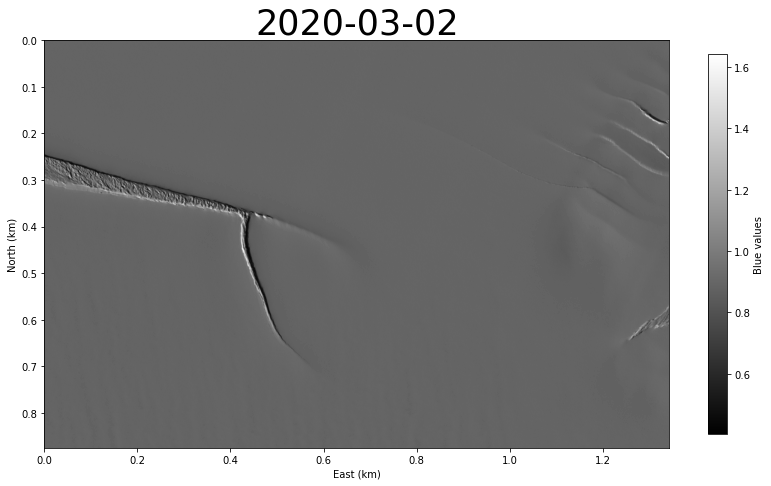

In [29]:
#Print Blue values
fig, ax = plt.subplots(figsize=(14,10))
im = ax.imshow(blue_raster.data, cmap='gray', extent=extent)
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('Blue values')
ax.set_xlabel('East (km)')
ax.set_ylabel('North (km)')
ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)

# Make GIFs

Make function for normalizing the bands

In [26]:
#Define utility function for scaling data to the range [0, 1]
def make_uniform_data(data, min_value=0, max_value=65535):
    # Scale the data (convert to float32 before scaling)
    data_norm = (data.astype(np.float32) - min_value) / (max_value - min_value)
    # Clip values to be between [0, 1]
    data_clipped = np.clip(data_norm, 0, 1)
    return data_clipped

We will be using red, blue, green bands to normalize and stack together. 

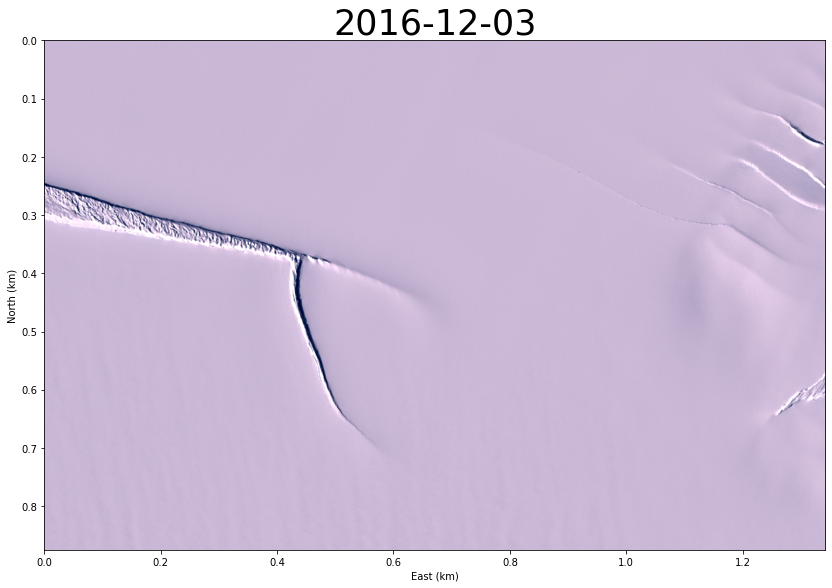

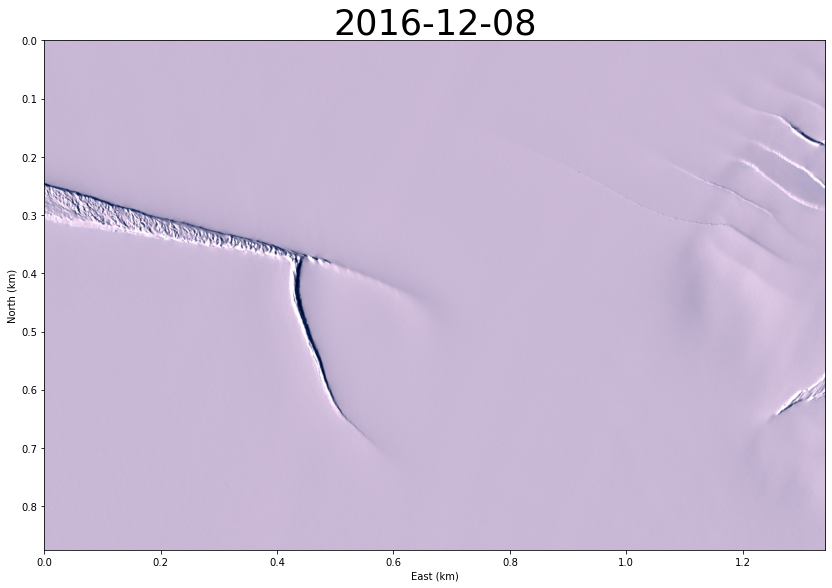

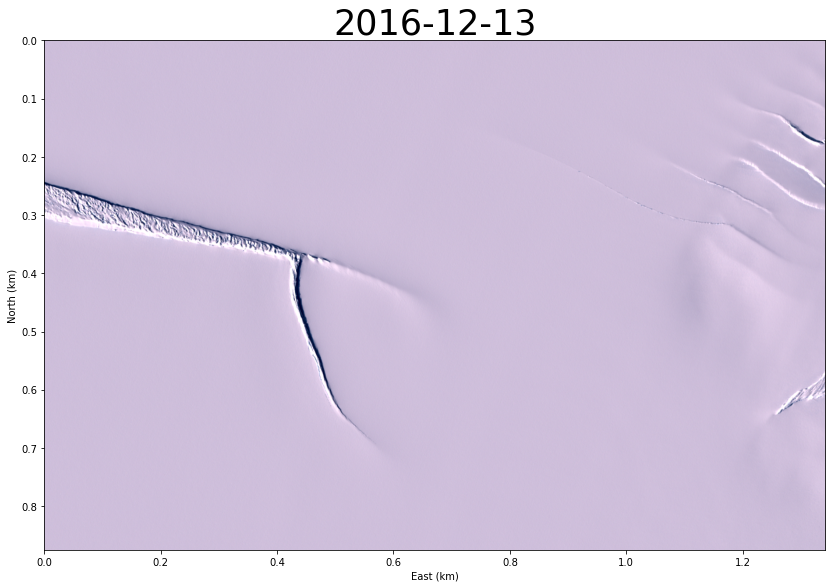

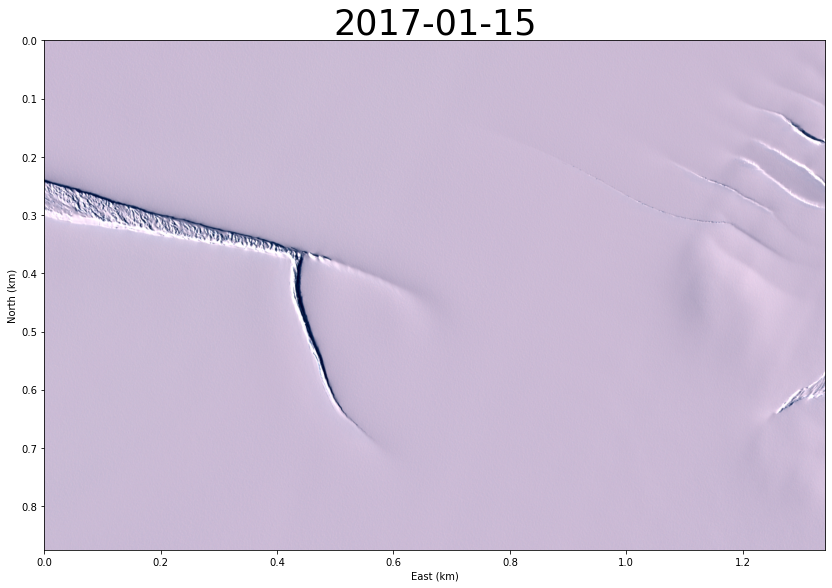

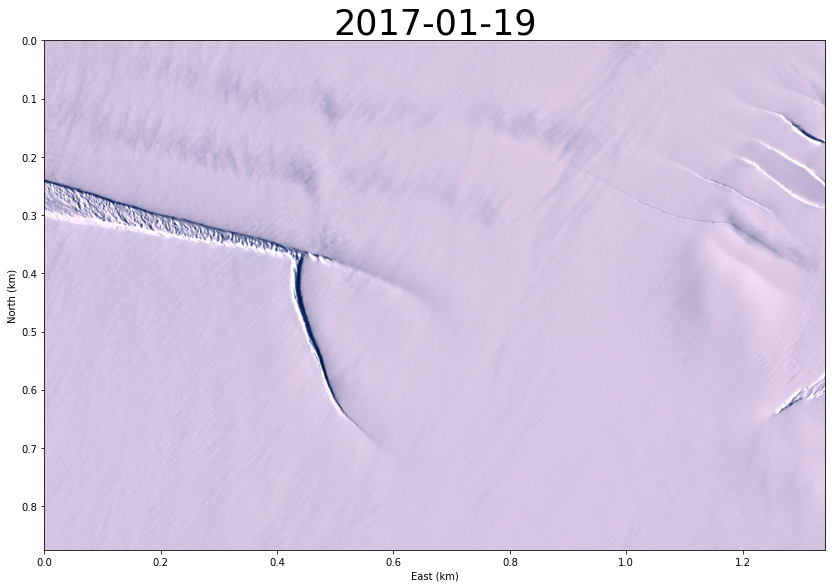

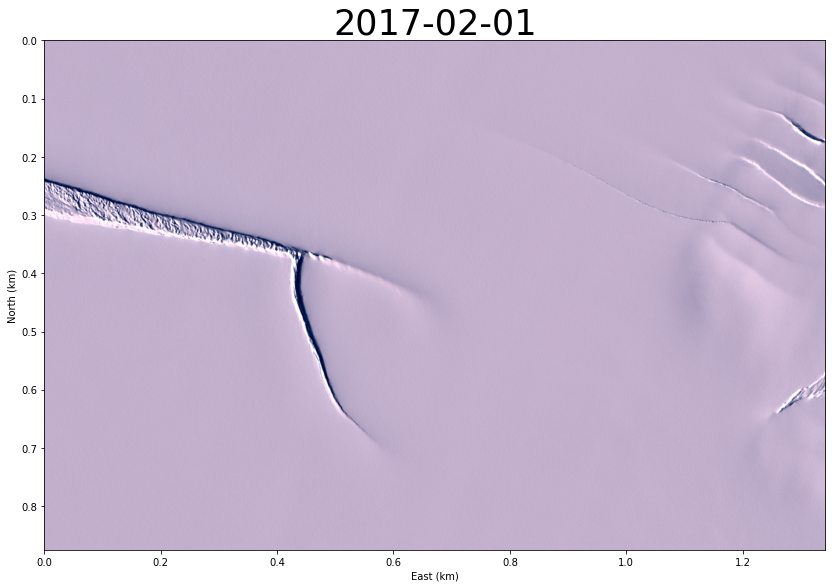

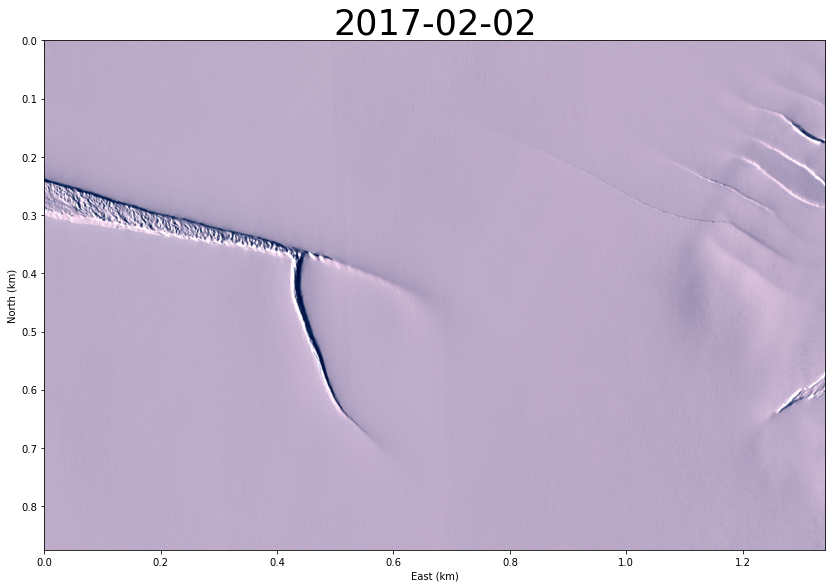

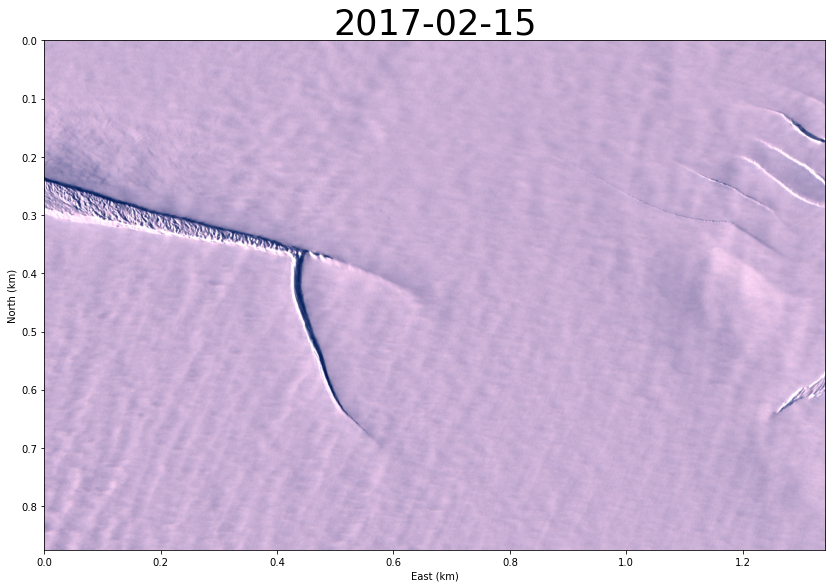

In [32]:
giffilename = 'pink'

folder = os.getcwd() + "\\" + folderpng + '\\' + giffilename
if not os.path.exists(folder):
    os.makedirs(folder)
os.chdir(folder)

frames =  []

for i in range(0, len(wms_bands_img)):
    #The filenames for the different bands
    #You may choose to stack other band combinations
    directory = r'C:\Users\UROP\Notebooks' +'\\'+ folderl1 + '\\Bands\\' + (str(wms_bands_dates[i])[:10])+'_'+'bands\\' +'B'
    blue_file = directory + str(1) +'.tif'
    green_file = directory + str(2) +'.tif'
    red_file = directory + str(3) +'.tif'
    data_file = directory + str(12) +'.tif'
    
    #Load only RasterInfo (metadata) for one of the bands
    hdr = ice.RasterInfo(blue_file)
    if 0 not in np.array(Image.open(data_file)):        
        
        #Read raster data for area of interest for blue, green, red band
        blue_raster = ice.Raster(blue_file)#, projWin=projWin)
        green_raster = ice.Raster(green_file)#, projWin=projWin)
        red_raster = ice.Raster(red_file)#, projWin=projWin)

        #Adjust normalization min and max value for images that starkly contrast with the other images
        #to display all images without adjustments, get rid of if statements and replace with content from else:
        #to find the i value, you may want to add a print(i) value to see which images match with which i
        #print(i)
        if i == 5:
            #Apply function to all bands
            blue_norm = make_uniform_data(blue_raster.data, min_value=.3, max_value=.95)
            green_norm = make_uniform_data(green_raster.data, min_value=.3, max_value=.95)
            red_norm = make_uniform_data(red_raster.data, min_value=.3, max_value=.95)

            #Stack the scaled bands along 3rd axis to create "true color" RGB
            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize=35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
        
        elif i == 9:
            #Apply function to all bands
            blue_norm = make_uniform_data(blue_raster.data, min_value=.3, max_value=.9)
            green_norm = make_uniform_data(green_raster.data, min_value=.3, max_value=.9)
            red_norm = make_uniform_data(red_raster.data, min_value=.3, max_value=.9)

            #Stack the scaled bands along 3rd axis to create "true color" RGB
            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize=35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
            
        else:
            #Apply function to all bands
            blue_norm = make_uniform_data(blue_raster.data, min_value=.3, max_value=1)
            green_norm = make_uniform_data(green_raster.data, min_value=.3, max_value=1)
            red_norm = make_uniform_data(red_raster.data, min_value=.3, max_value=1)
            #Stack the scaled bands along 3rd axis to create "true color" RGB
            rgb = np.dstack((red_norm, green_norm, blue_norm))
            #View it
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize=35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
        
frames[0].save(giffilename + 'gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)
os.chdir(cwd)

Due to the photos being taken at different times of day, seasons, and some having satellite streaks, running without individual adjusting values can cause a drastic, distracting change in color as seen here:

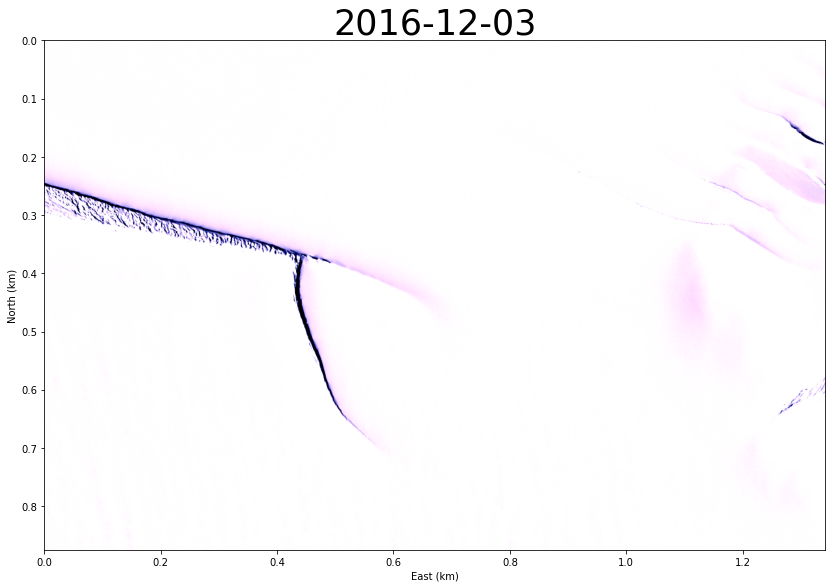

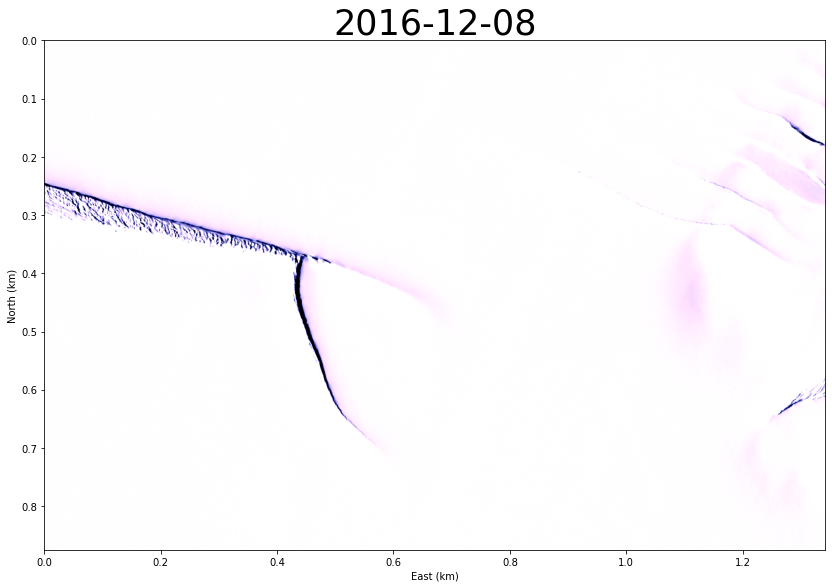

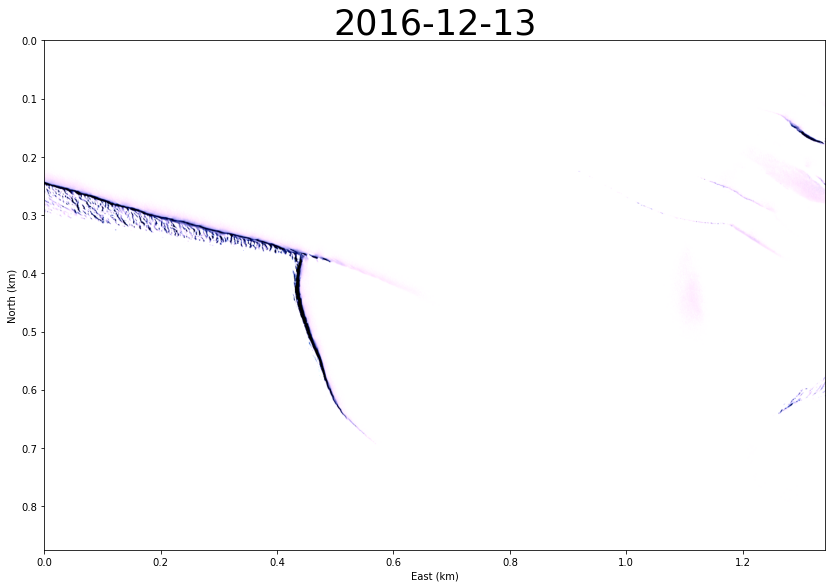

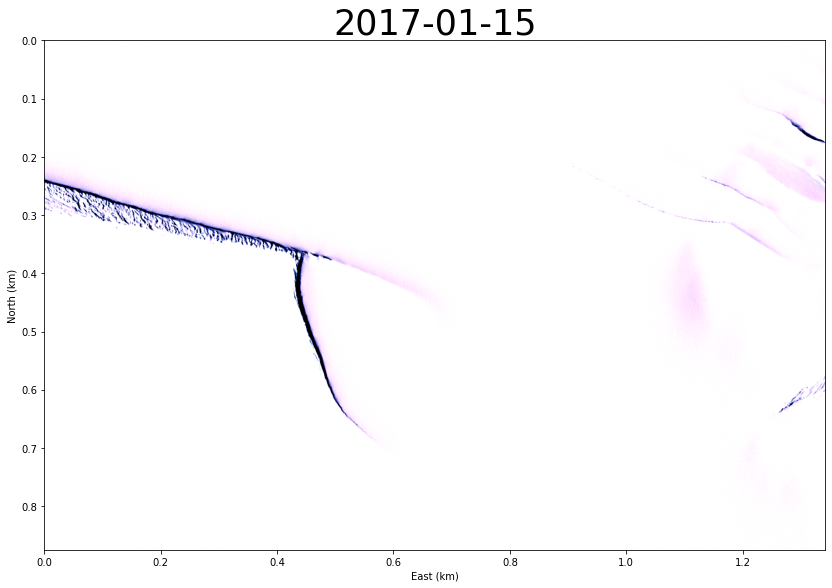

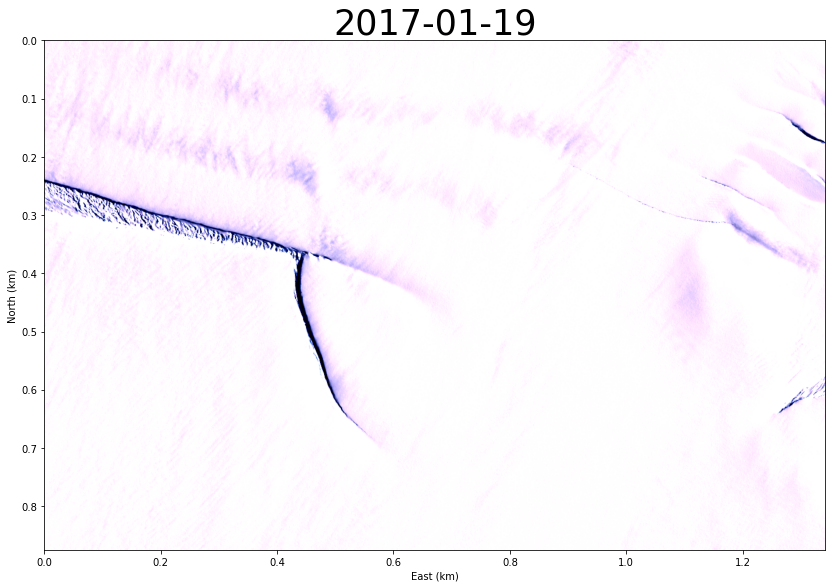

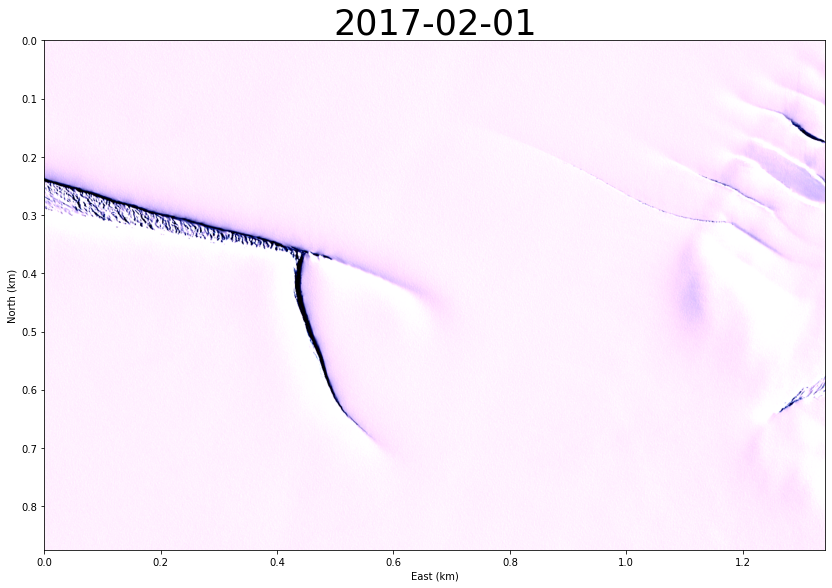

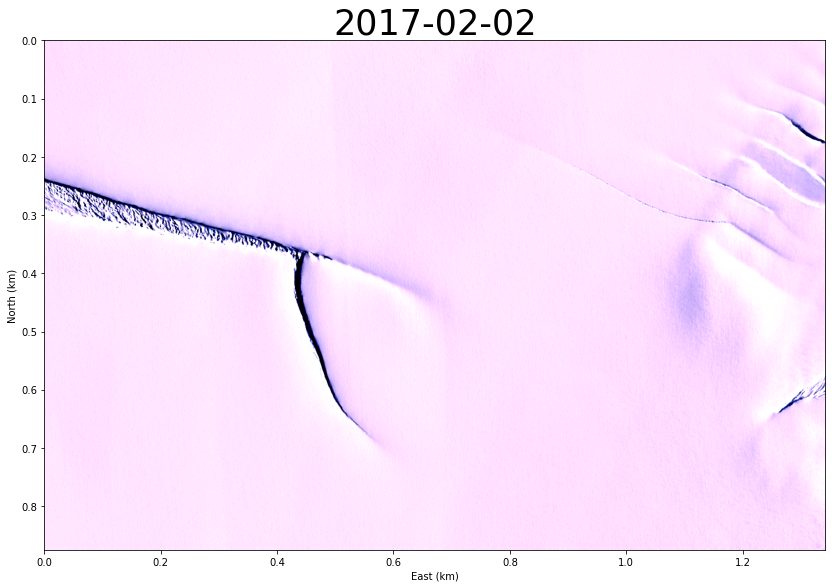

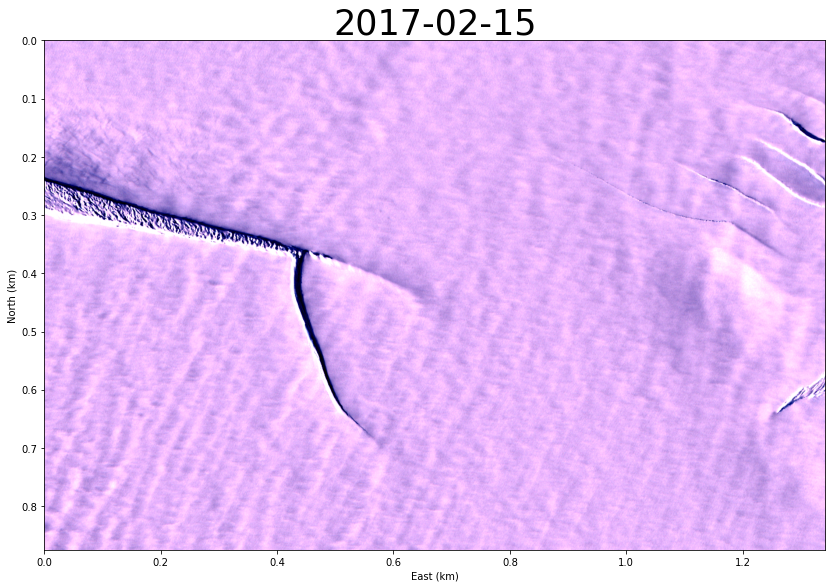

In [27]:
giffilename = 'badexample'
folder = os.getcwd() + "\\" + folderpng + '\\' + giffilename
if not os.path.exists(folder):
    os.makedirs(folder)
os.chdir(folder)

frames =  []

for i in range(0, len(wms_bands_img)):
    directory = r'C:\Users\UROP\Notebooks' +'\\'+ folderl1 + '\\Bands\\' + (str(wms_bands_dates[i])[:10])+'_'+'bands\\' +'B'
    blue_file = directory + str(1) +'.tif'
    green_file = directory + str(2) +'.tif'
    red_file = directory + str(3) +'.tif'
    data_file = directory + str(12) +'.tif'
    
    hdr = ice.RasterInfo(blue_file)
    
    if 0 not in np.array(Image.open(data_file)):       
        blue_raster = ice.Raster(blue_file)
        green_raster = ice.Raster(green_file)
        red_raster = ice.Raster(red_file)

        blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.8)
        green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.8)
        red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.8)

        rgb = np.dstack((red_norm, green_norm, blue_norm))
        fig, ax = plt.subplots(figsize=(14,10))
        im = ax.imshow(rgb, extent=extent)
        ax.set_xlabel('East (km)')
        ax.set_ylabel('North (km)')
        ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
        name = giffilename + str(i) + '.png'
        plt.savefig(name)
        new_frame = Image.open(name)
        frames.append(new_frame)

        
frames[0].save(giffilename + 'gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)
os.chdir(cwd)


Adjusted for the ones that drastically differ from the other images:

3
6
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24


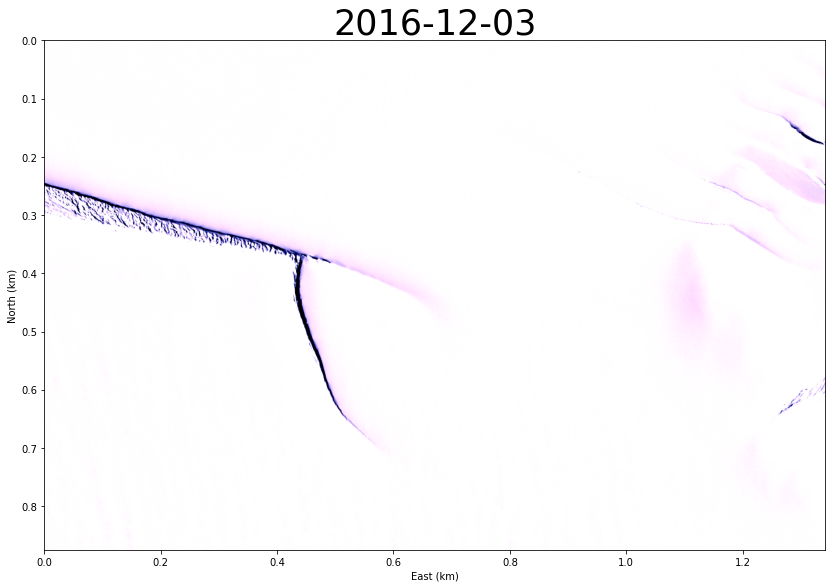

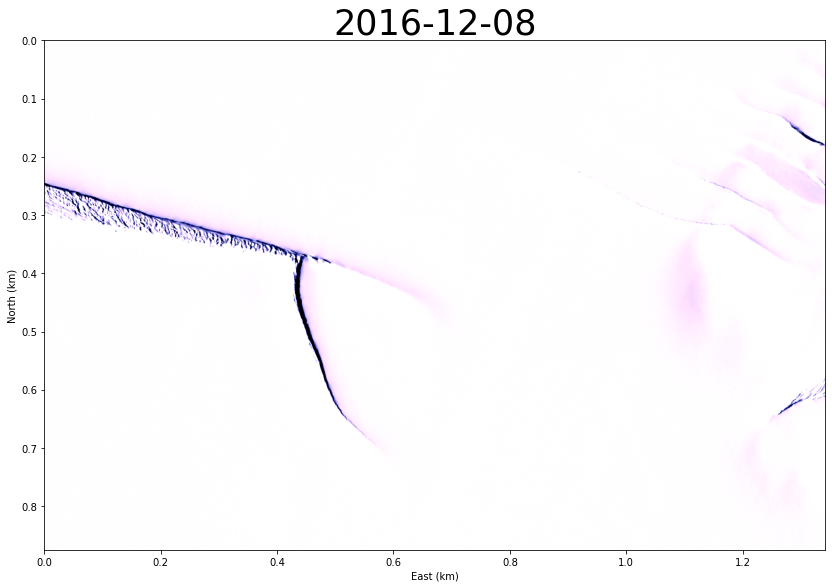

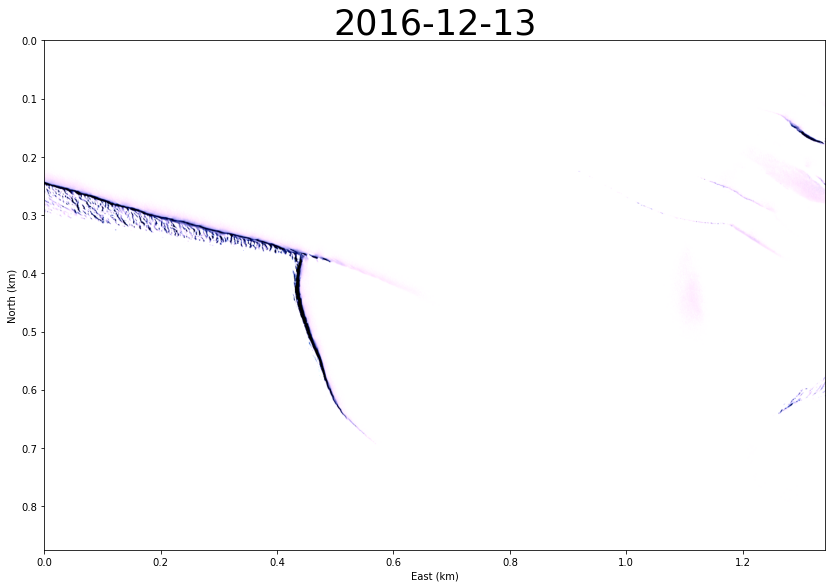

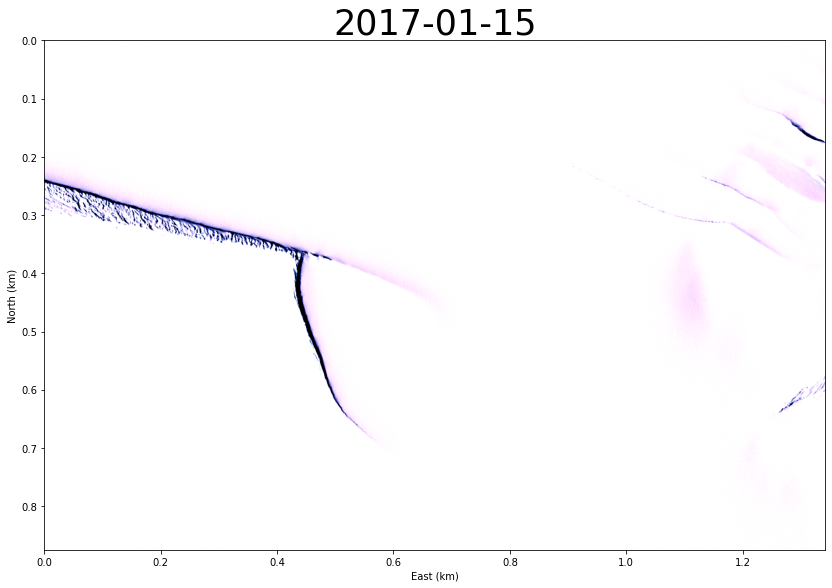

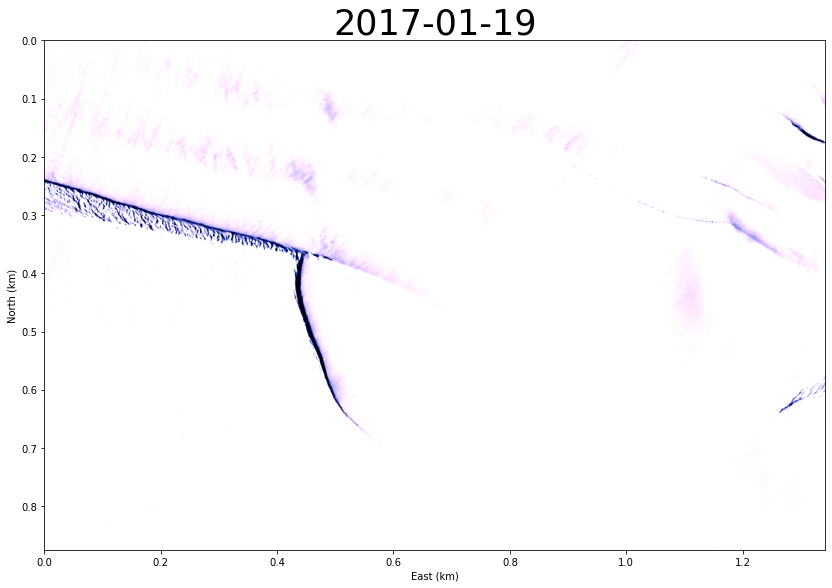

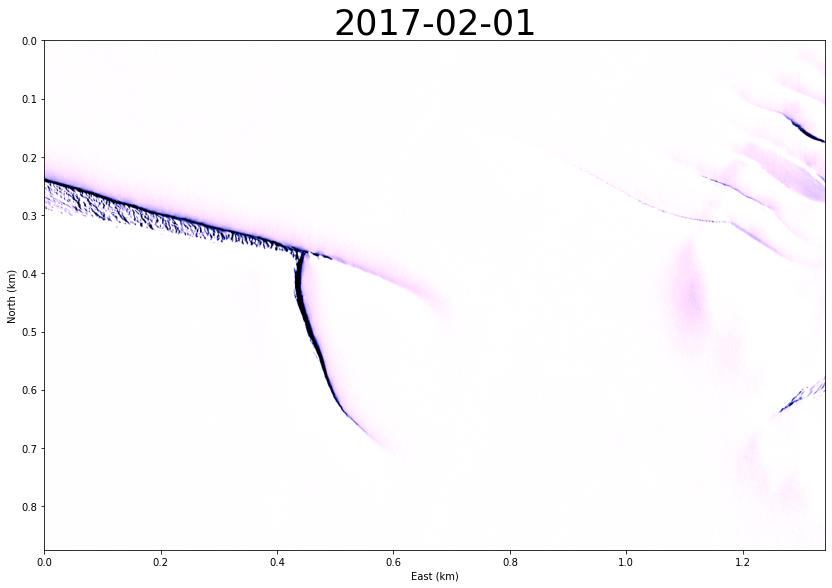

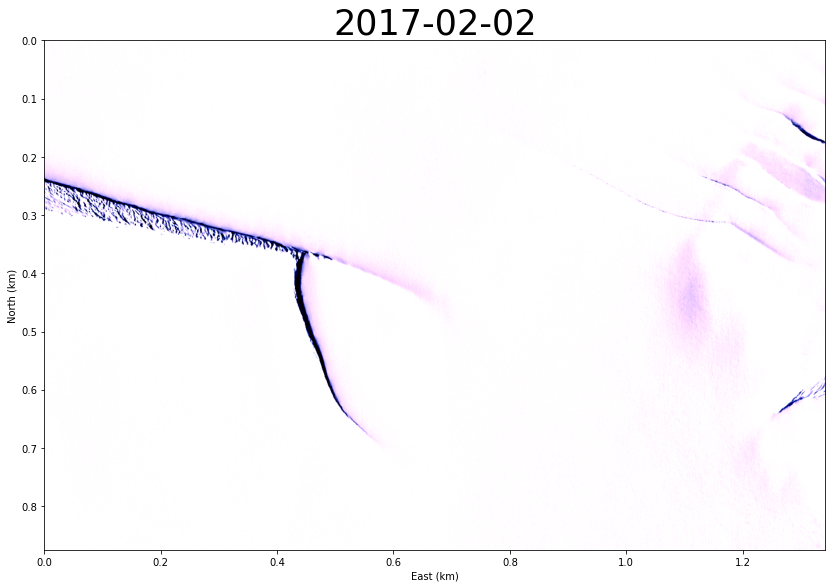

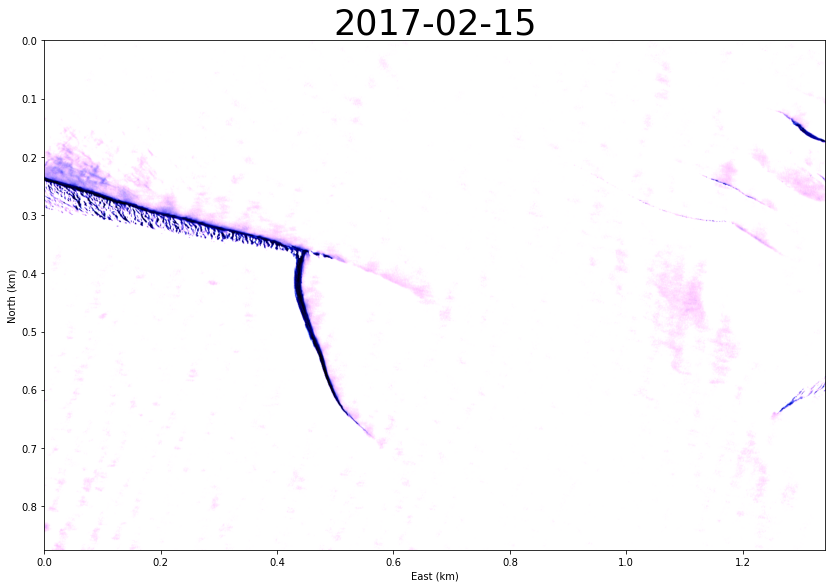

In [33]:
giffilename = 'white'
folder = os.getcwd() + "\\" + folderpng + '\\' + giffilename
if not os.path.exists(folder):
    os.makedirs(folder)
os.chdir(folder)

frames =  []

for i in range(0, len(wms_bands_img)):
    directory = r'C:\Users\UROP\Notebooks' +'\\'+ folderl1 + '\\Bands\\' + (str(wms_bands_dates[i])[:10])+'_'+'bands\\' +'B'
    blue_file = directory + str(1) +'.tif'
    green_file = directory + str(2) +'.tif'
    red_file = directory + str(3) +'.tif'
    data_file = directory + str(12) +'.tif'
    
    hdr = ice.RasterInfo(blue_file)
    
    if 0 not in np.array(Image.open(data_file)):       
        blue_raster = ice.Raster(blue_file)
        green_raster = ice.Raster(green_file)
        red_raster = ice.Raster(red_file)
    
    
        if i == 2:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.8)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.8)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.8)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)

        elif i == 4:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.8)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.8)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.8)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)

        elif i == 5 or i == 7:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.78)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.78)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.78)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
            
        elif i == 8:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.76)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.76)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.76)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
            
        elif i == 9:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.69)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.69)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.69)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)
            
        else:
            blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.8)
            green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.8)
            red_norm = make_uniform_data(red_raster.data, min_value=.5, max_value=.8)

            rgb = np.dstack((red_norm, green_norm, blue_norm))
            fig, ax = plt.subplots(figsize=(14,10))
            im = ax.imshow(rgb, extent=extent)
            ax.set_xlabel('East (km)')
            ax.set_ylabel('North (km)')
            ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
            name = giffilename + str(i) + '.png'
            plt.savefig(name)
            new_frame = Image.open(name)
            frames.append(new_frame)

        
frames[0].save(giffilename + 'gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)
os.chdir(cwd)


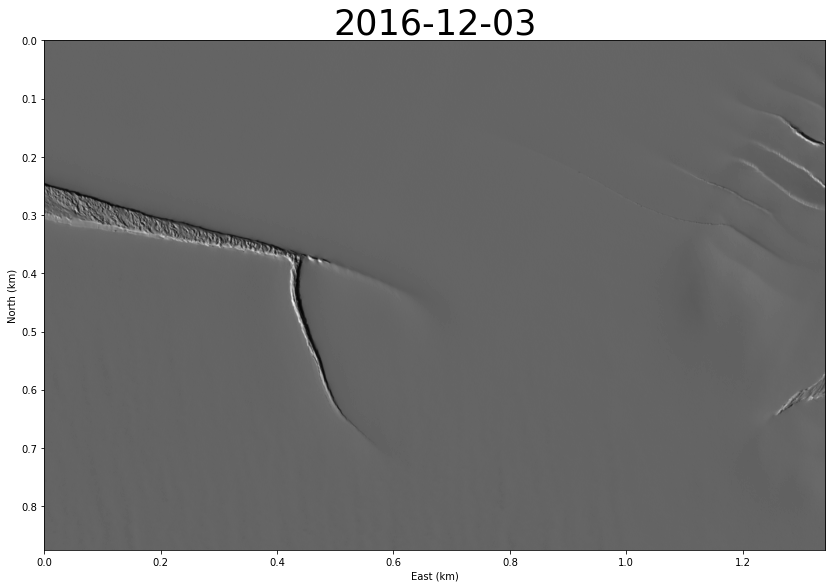

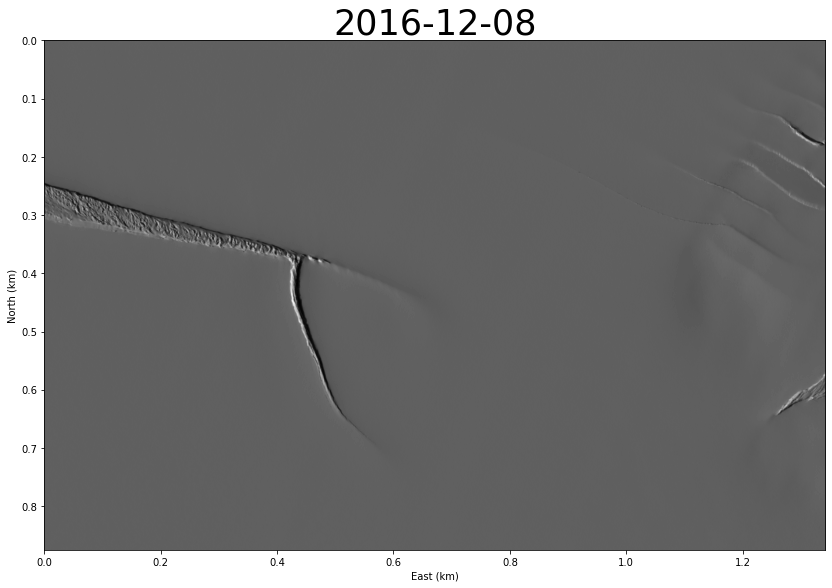

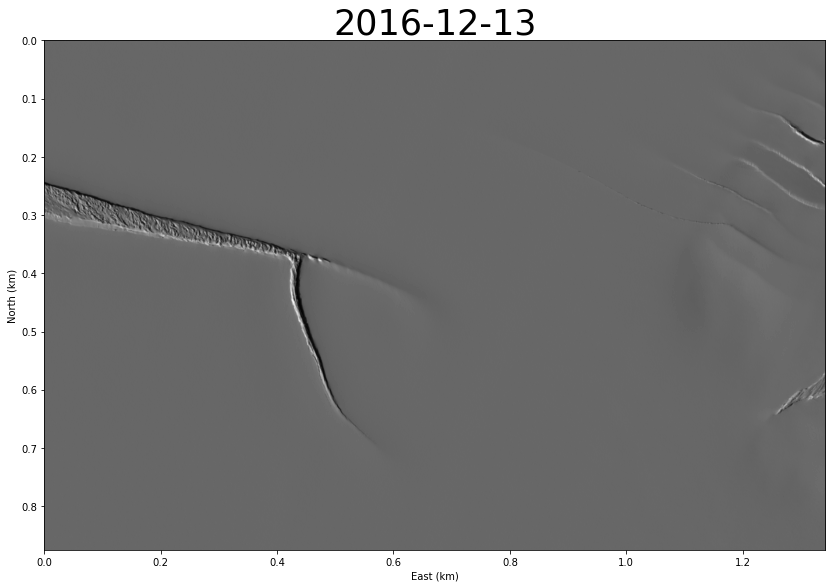

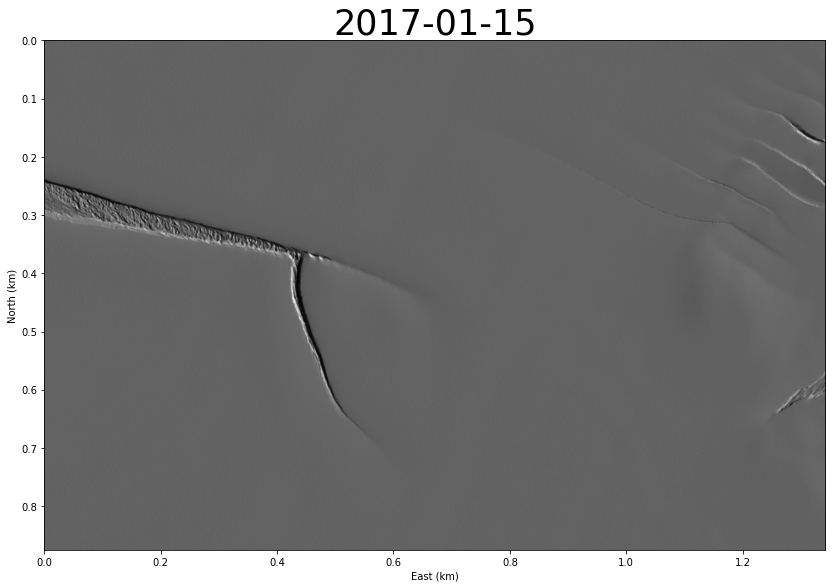

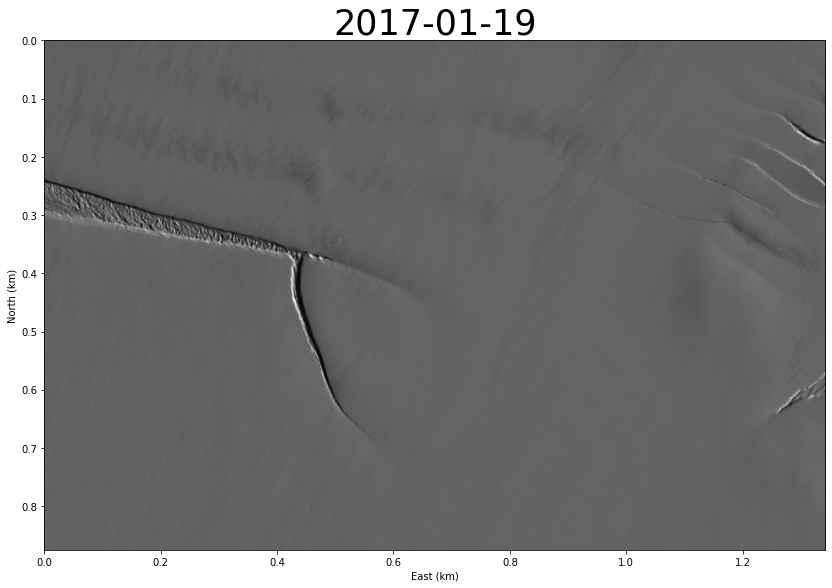

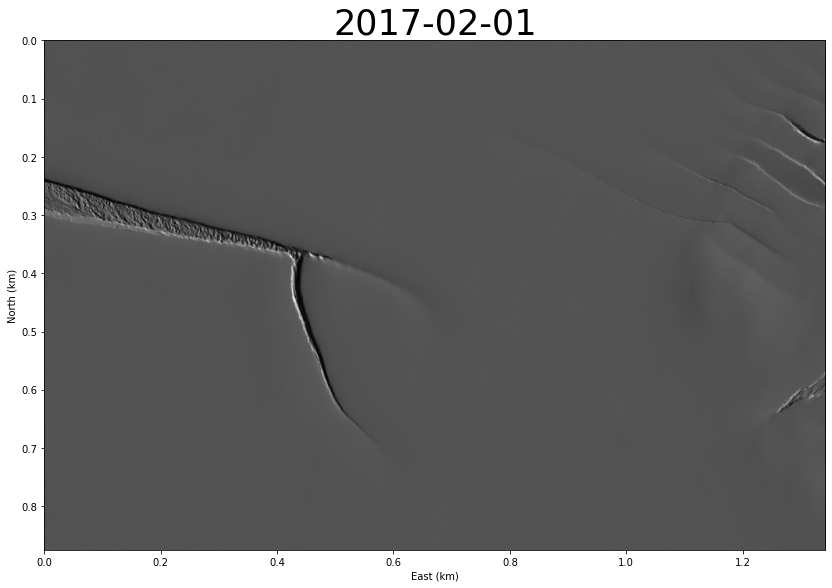

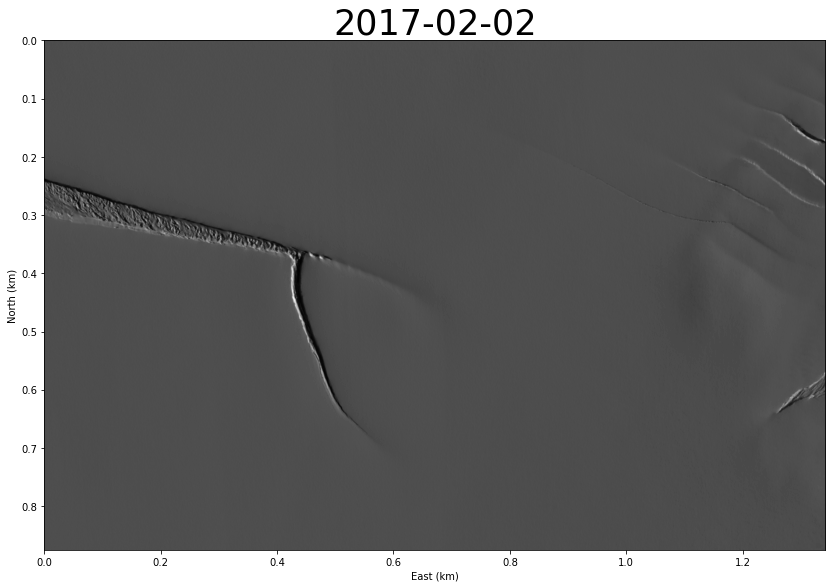

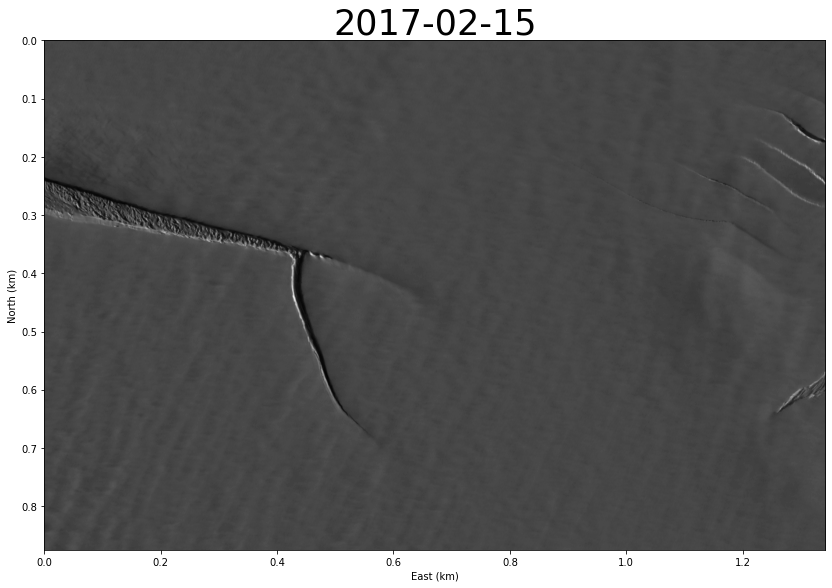

In [41]:
giffilename = 'grayscale'

folder = os.getcwd() + "\\" + folderpng + '\\' + giffilename
if not os.path.exists(folder):
    os.makedirs(folder)
os.chdir(folder)

frames =  []

for i in range(0, len(wms_bands_img)):
    directory = r'C:\Users\UROP\Notebooks' +'\\'+ folderl1 + '\\Bands\\' + (str(wms_bands_dates[i])[:10])+'_'+'bands\\' +'B'
    blue_file = directory + str(1) +'.tif'
    green_file = directory + str(2) +'.tif'
    red_file = directory + str(3) +'.tif'
    data_file = directory + str(12) +'.tif'
    
    hdr = ice.RasterInfo(blue_file)
    
    if 0 not in np.array(Image.open(data_file)):      

        blue_raster = ice.Raster(blue_file)
        green_raster = ice.Raster(green_file)
        red_raster = ice.Raster(red_file)

        blue_norm = make_uniform_data(blue_raster.data, min_value=.5, max_value=.8)
        green_norm = make_uniform_data(green_raster.data, min_value=.5, max_value=.8)
        red_norm = make_uniform_data(red_raster.data, min_value=.2, max_value=.8)

        ##Stack the scaled bands along 3rd axis to create "true color" RGB
        #rgb = np.dstack((red_norm, green_norm, blue_norm))
        #Create grayscale (make sure to convert integer arrays to float32)
        #Use original, unclipped raster data (preserve as much information as possible)
        gray = np.sqrt(blue_raster.data.astype(np.float32)**2 +
        green_raster.data.astype(np.float32)**2 +
        red_raster.data.astype(np.float32)**2)
        #Scale values to [0, 1]
        gray = make_uniform_data(gray, .2, 100)
        fig, ax = plt.subplots(figsize=(14,10))
        im = ax.imshow(gray, cmap='gray', extent=extent)
        ax.set_xlabel('East (km)')
        ax.set_ylabel('North (km)')
        ax.set_title((str(wms_bands_dates[i])[:10]), fontsize = 35)
        
        name = giffilename + str(i) + '.png'
        plt.savefig(name)
        new_frame = Image.open(name)
        frames.append(new_frame)
        
        
frames[0].save(giffilename + 'gif.gif', format='GIF',
               append_images=frames[1:],
               save_all=True,
               duration=300, loop=0)
os.chdir(cwd)